In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import glob
from imp import reload
import tqdm

import bokeh.io
bokeh.io.output_notebook()
import bebi103

import gbeflow

Loading BokehJS ...

In [2]:
import matlab.engine
eng = matlab.engine.start_matlab()
eng.addpath(r'../matlab',nargout=0)

In [53]:
eng = matlab.engine.start_matlab()
eng.addpath(r'../matlab',nargout=0)

In [52]:
eng.quit()

# Load files

In [3]:
files = glob.glob('../data/*.czi')
files

['../data/20180108_htl_glc_sc11_mmzm.czi',
 '../data/20180112_htlglc_tl_sc19_mmzp.czi',
 '../data/20180110_htl_glc_sc14_mmzp.czi',
 '../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.czi',
 '../data/20180112_htlglc_tl_sc11_mmzp.czi',
 '../data/20180110_htl_glc_sc15_mmzm.czi',
 '../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.czi',
 '../data/20180108_htl_glc_sc9_mmzp.czi',
 '../data/20180112_htlglc_tl_sc4_resille.czi',
 '../data/20180110_htl_glc_sc6_mmzm.czi',
 '../data/20180108_htl_glc_sc2_mmzm_wp.czi']

In [4]:
raw = {}
for f in files:
    raw[f] = gbeflow.CziImport(f)
    print(f)


            There are 1 ROIs,
                       2 channels and
                       156 timepoints.
            
(1, 1, 2, 156, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180108_htl_glc_sc11_mmzm.czi

            There are 1 ROIs,
                       2 channels and
                       169 timepoints.
            
(1, 1, 2, 169, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180112_htlglc_tl_sc19_mmzp.czi

            There are 1 ROIs,
                       1 channels and
                       167 timepoints.
            
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180110_htl_glc_sc14_mmzp.czi

            There are 1 ROIs,
                       1 channels and
                       167 timepoints.
            
(1, 1, 1, 

# Pick autofluoresence channel

In [9]:
gfp = {}
for f in files:
    
    # Check maximum intensity value of first time point in first channel
    mx = raw[f].data[0,0].max()
    print(mx)
    
    if mx < 10**4:
        # If greater than 10^4 save first channel
#         gbeflow.write_hyperstack(raw[f][0],name)
        gfp[f] = raw[f].data[0]
    else:
#         gbeflow.write_hyperstack(raw[f][1],name)
        gfp[f] = raw[f].data[1]
        
    print(gfp[f][0].max())

1863
1863
1102
1102
1624
1624
2501
2501
1757
1757
2594
2594
1880
1880
3616
3616
4940
4940
1096
1096
5386
5386


In [10]:
brt = {}
for f in files:
    name = f[:-3]+'h5'
#     print(name)
    
    # Check maximum intensity value of first time point in first channel
    mx = raw[f].data[0,0].max()
    print(mx)
    
    if mx > 10**4:
        # If greater than 10^4 save first channel
#         gbeflow.write_hyperstack(raw[f][0],name)
        brt[f] = raw[f].data[0]
    else:
#         gbeflow.write_hyperstack(raw[f][1],name)
        brt[f] = raw[f].data[1]
        
#     print(brt[f][0].max())

1863
1102
1624
2501
1757
2594
1880
3616
4940
1096
5386


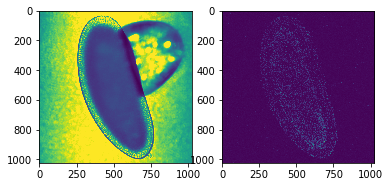

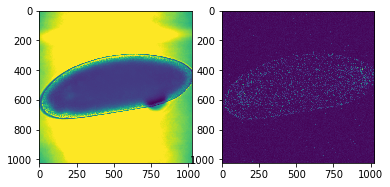

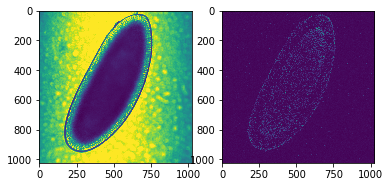

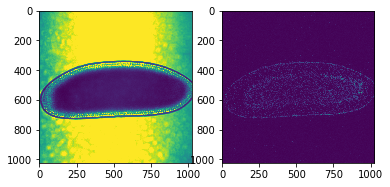

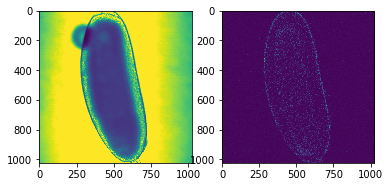

...

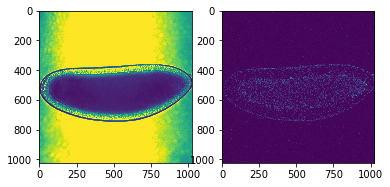

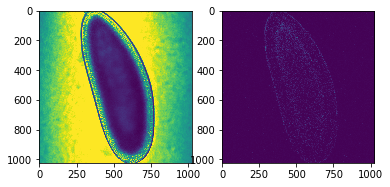

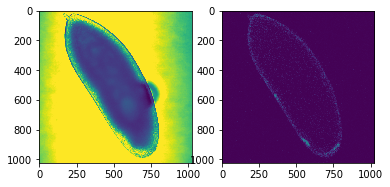

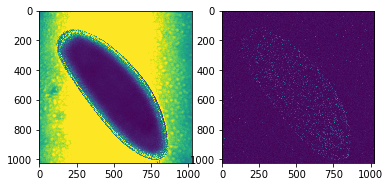

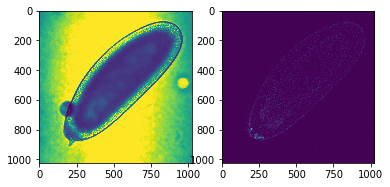

In [14]:
for f in files:
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(brt[f][0])
    ax[1].imshow(gfp[f][0])

# Mask gfp data based on brightfield

In [15]:
reload(gbeflow)

<module 'gbeflow' from '/Users/morganschwartz/Code/germband-extension/gbeflow/__init__.py'>

In [21]:
clicks = []
for f in files:
    clk = bebi103.viz.record_clicks(raw[f].data[1,0],flip=False)
    clicks.append(clk)

In [22]:
Ldf = []
for clk in clicks:
    Ldf.append(clk.to_df())
    
points = pd.concat(Ldf,keys=files)
points

x            y
../data/20180108_htl_glc_sc11_mmzm.czi             0   686.410256   988.274286
                                                   1   393.192308    43.634286
../data/20180112_htlglc_tl_sc19_mmzp.czi           0    15.679487   640.982857
../data/20180110_htl_glc_sc14_mmzp.czi             0   246.769231   937.211429
                                                   1   705.525641    33.622857
../data/20180110_htl_glc-Create Image Subset-02... 0    16.948718   614.777143
                                                   1  1019.602564   527.622857
../data/20180112_htlglc_tl_sc11_mmzp.czi           0   615.294872  1009.245714
                                                   1   425.974359    23.394286
../data/20180110_htl_glc_sc15_mmzm.czi             0   465.756410   999.428571
                                                   1   436.974359    10.468571
../data/20180110_htl_glc-Create Image Subset-01... 0  1010.948718   483.931429
                                                   1    19.269231   522.171429
../data/20180108_htl_glc_sc9_mmzp.czi              0   629.358974  1013.611429
                                                   1   359.487179     6.000000
../data/20180112_htlglc_tl_sc4_resille.czi         0   719.794872   978.342857
                                                   1   220.269231    40.228571
../data/20180110_htl_glc_sc6_mmzm.czi              0   814.769231   997.725714
                                                   1   161.961538   161.074286
../data/20180108_htl_glc_sc2_mmzm_wp.czi           0   920.435897   106.480000
                                                   1   195.410256   855.782857

In [28]:
df = me[files[0]].df

In [29]:
l = np.sqrt((df.iloc[1].x - df.iloc[0].x)**2 + 
                    (df.iloc[1].y - df.iloc[0].y)**2)

In [30]:
l

989.1013573190371

In [31]:
me = {}
for f in files:
    try:
        me[f] = gbeflow.MaskEmbryo(points.loc[f])
        p = bebi103.viz.imshow(me[f].contour_embryo(brt[f][0]),flip=False,title=f)
        p.line(me[f].fell[:,0],me[f].fell[:,1],color='red')
        p.scatter(points.loc[f].x,points.loc[f].y,color='white',size=10)
        bokeh.io.show(p)
    except:
        print('Failed: ',f)

Failed:  ../data/20180112_htlglc_tl_sc19_mmzp.czi


In [32]:
files

['../data/20180108_htl_glc_sc11_mmzm.czi',
 '../data/20180112_htlglc_tl_sc19_mmzp.czi',
 '../data/20180110_htl_glc_sc14_mmzp.czi',
 '../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.czi',
 '../data/20180112_htlglc_tl_sc11_mmzp.czi',
 '../data/20180110_htl_glc_sc15_mmzm.czi',
 '../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.czi',
 '../data/20180108_htl_glc_sc9_mmzp.czi',
 '../data/20180112_htlglc_tl_sc4_resille.czi',
 '../data/20180110_htl_glc_sc6_mmzm.czi',
 '../data/20180108_htl_glc_sc2_mmzm_wp.czi']

In [33]:
f = '../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.czi'

In [37]:
hst = brit[f]
for t in tqdm.tqdm(range(hst.shape[0])):
    mask = me[f].contour_embryo(brt[f][t])
    hst[t] = me[f].mask_image(hst[t],mask)
name = f[:-4]+'_gfp_mask.h5'
gbeflow.write_hyperstack(hst,name)

100%|██████████| 167/167 [28:47<00:00,  4.63s/it]


# Save hdf5 file as tiff using fiji

The masking results aren't consistent and the mask was applied to the wrong channel. For this purpose, I am going to skip to vector calculation and just run the analysis on the unmasked image.

# Define parameters

In [48]:
mov = '/Users/morganschwartz/Code/germband-extension/data/20180110_htl_glc-CreateImageSubset-01_sc10_wt_488.tif'

In [43]:
BinaryMask = matlab.single([])
scale = 0.5
dt = 1.0
BoxSize = 30
BlurSTD = 1.0 # Must be float
ArrowSize= 5

# Test vector calculation

It seems like matlab is sensitive to file names with spaces.

In [54]:
n = 'yolk3'
f = mov
eng.OpticalFlowOutput(n,f,BinaryMask,BoxSize,BlurSTD,ArrowSize,scale,dt,nargout=0)

In [ ]:
vxvy = gbeflow.tidy_vector_data